## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


The images for camera calibration are stored in the folder called `camera_cal`.  The images in `test_images` are for testing your pipeline on single frames.  If you want to extract more test images from the videos, you can simply use an image writing method like `cv2.imwrite()`, i.e., you can read the video in frame by frame as usual, and for frames you want to save for later you can write to an image file.  

To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called `ouput_images`, and include a description in your writeup for the project of what each image shows.    The video called `project_video.mp4` is the video your pipeline should work well on.  

The `challenge_video.mp4` video is an extra (and optional) challenge for you if you want to test your pipeline under somewhat trickier conditions.  The `harder_challenge.mp4` video is another optional challenge and is brutal!

If you're feeling ambitious (again, totally optional though), don't stop there!  We encourage you to go out and take video of your own, calibrate your camera and show us how you would implement this project from scratch!

---
## First, I'll compute the camera calibration using chessboard images


In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import matplotlib.image as mpimg
plt.style.use(plt.style.available[17]) #black borders help with dark theme and viewing thresholded images

In [2]:
import os 
print(os.getcwd())
print(plt.style.available)
plt.style.use(plt.style.available[1]) #black borders help with dark theme and viewing thresholded images


/Volumes/STASH/darshansonde/Code/ml/sdcn/CarND-P4
['bmh', 'ggplot', 'seaborn-paper', 'seaborn-muted', 'seaborn-dark-palette', 'seaborn-poster', 'seaborn-talk', 'classic', 'seaborn-notebook', 'seaborn-whitegrid', 'seaborn-pastel', 'seaborn-dark', 'seaborn-darkgrid', 'grayscale', 'seaborn-bright', 'seaborn-deep', 'seaborn-colorblind', 'fivethirtyeight', 'dark_background', 'seaborn-white', 'seaborn-ticks']


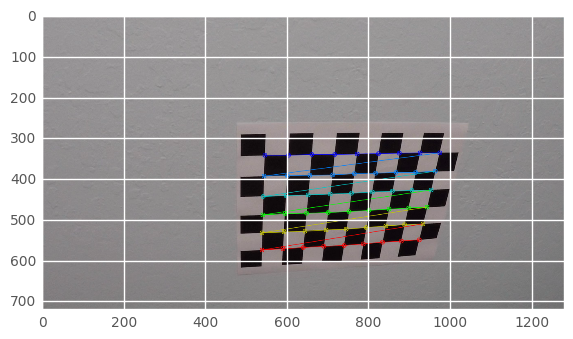

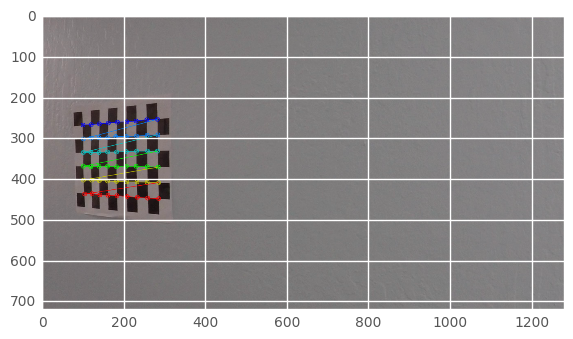

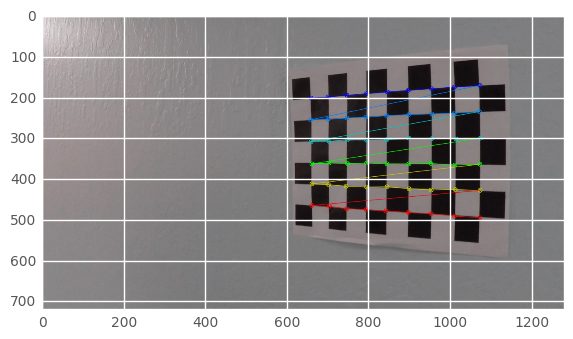

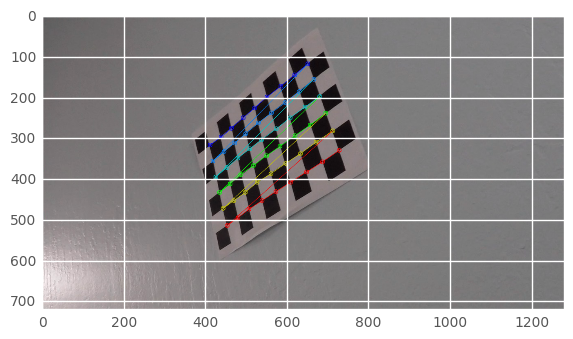

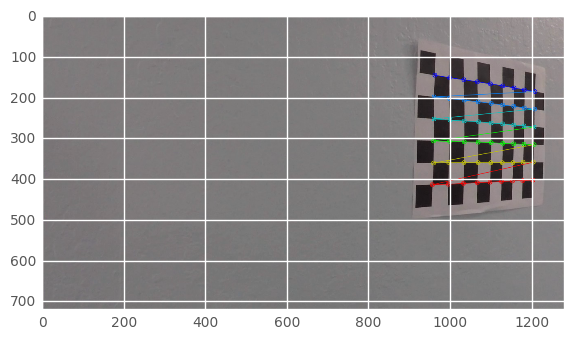

...

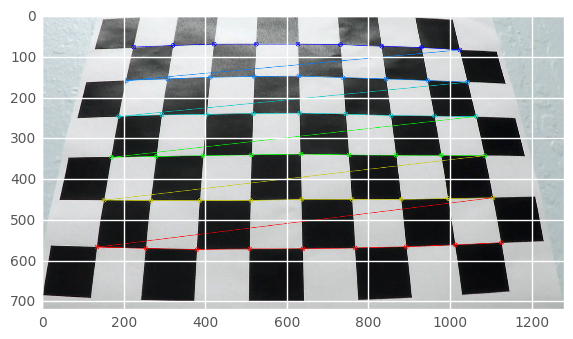

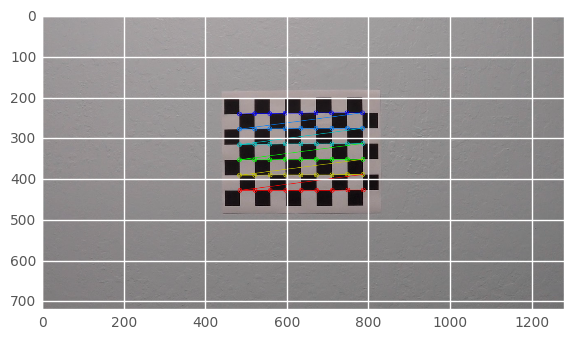

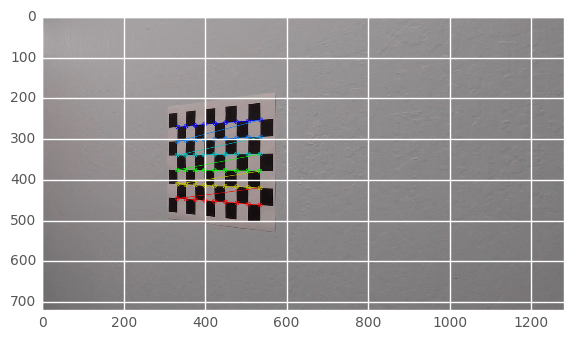

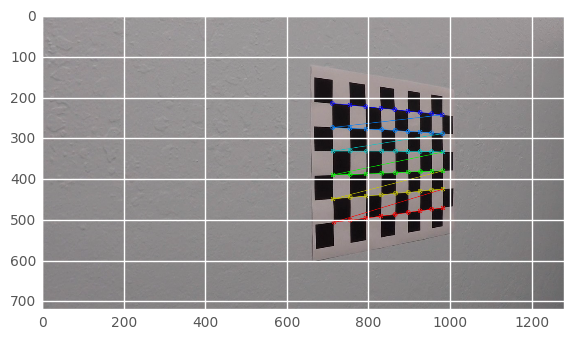

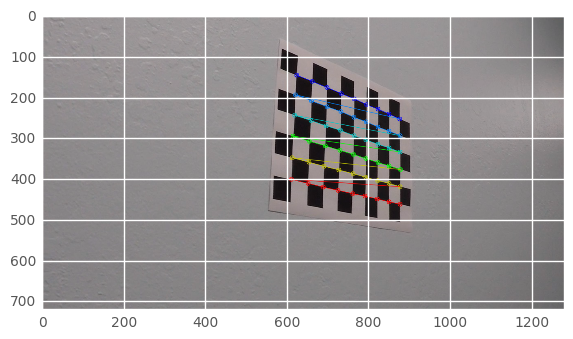

In [3]:
nx = 9
ny = 6
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(nx,ny,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        plt.imshow(img)
        plt.show()

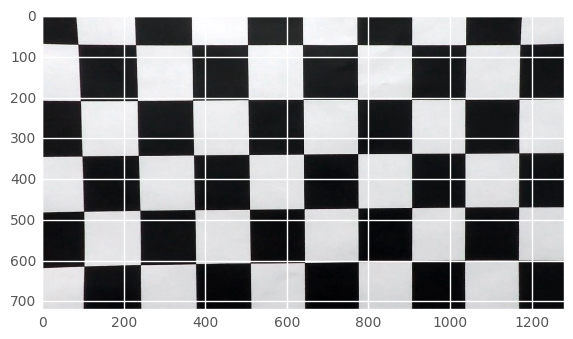

In [4]:
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist)
    return undist

test_image = cv2.imread('camera_cal/calibration1.jpg')
undist = cal_undistort(test_image, objpoints, imgpoints)

plt.imshow(undist)
plt.grid(True)
plt.show()

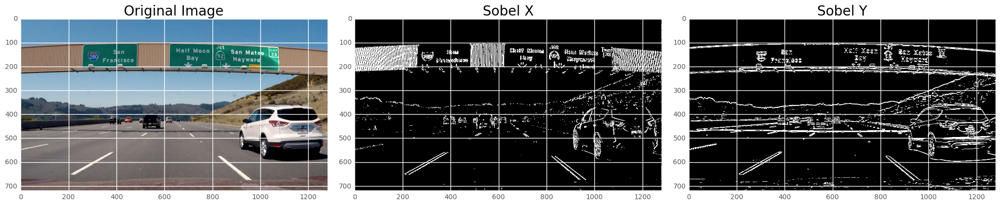

In [5]:
def abs_sobel_thresh(img, orient='x', ksize=3,  thresh=(0,255)):    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = None
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    # 3) Take the absolute value of the derivative or gradient
    abssol = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled = np.uint(255*abssol/np.max(abssol))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    
    binary_output = np.zeros_like(scaled)
    binary_output[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

image = cv2.imread('test_images/signs_vehicles_xygrad.png')
sobelx = abs_sobel_thresh(image, orient='x', thresh=(20,100))
sobely = abs_sobel_thresh(image, orient='y', thresh=(20,100))

f, (ax_orig, ax1, ax2) = plt.subplots(1, 3, figsize=(20, 10))
f.tight_layout()
ax_orig.imshow(image[..., ::-1])
ax_orig.set_title('Original Image', fontsize=20)
ax1.imshow(sobelx, cmap='gray')
ax1.set_title('Sobel X', fontsize=20)
ax2.imshow(sobely, cmap='gray')
ax2.set_title('Sobel Y', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

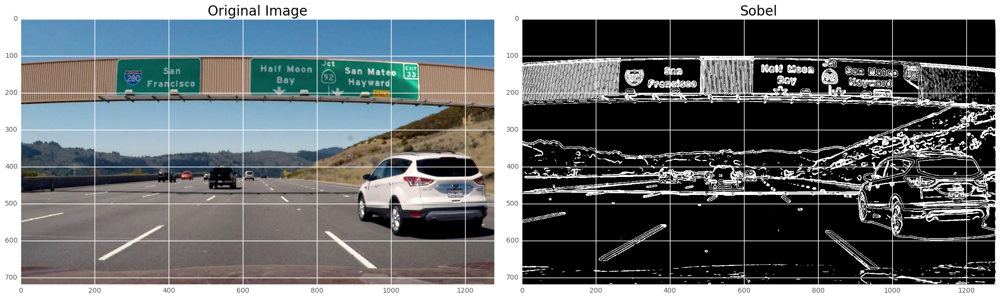

In [6]:
def mag_thresh(img, ksize=3, thresh=(0,255)):    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    
        
    # 3) Take the sqrt mag
    abssolxy = np.sqrt(sobelx ** 2 + sobely ** 2)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaledxy = (abssolxy*255/np.max(abssolxy)).astype(np.uint8)

    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaledxy)
    binary_output[(scaledxy >= thresh[0]) & (scaledxy <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

image = cv2.imread('test_images/signs_vehicles_xygrad.png')
sobel = mag_thresh(image,ksize=9, thresh=(20, 80))

f, (ax_orig, ax1) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax_orig.imshow(image[..., ::-1])
ax_orig.set_title('Original Image', fontsize=20)
ax1.imshow(sobel, cmap='gray')
ax1.set_title('Sobel', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

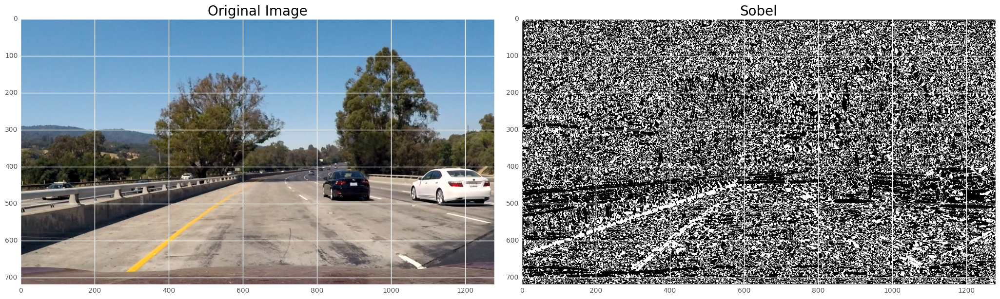

In [7]:
def dir_thresh(img, ksize=3, thresh=(0, np.pi/2)):    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    abssobelx = np.absolute(sobelx)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    abssobely = np.absolute(sobely)
    
    abssobelxy = np.arctan2(abssobely,abssobelx)

    binary_output = np.zeros_like(abssobelxy)
    binary_output[(abssobelxy >= thresh[0]) & (abssobelxy <= thresh[1])] = 1
    return binary_output

image = cv2.imread('test_images/test1.jpg')
sobel = dir_thresh(image, ksize=15, thresh=(0.7,1.3))

f, (ax_orig, ax1) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax_orig.imshow(image[..., ::-1])
ax_orig.set_title('Original Image', fontsize=20)
ax1.imshow(sobel, cmap='gray')
ax1.set_title('Sobel', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

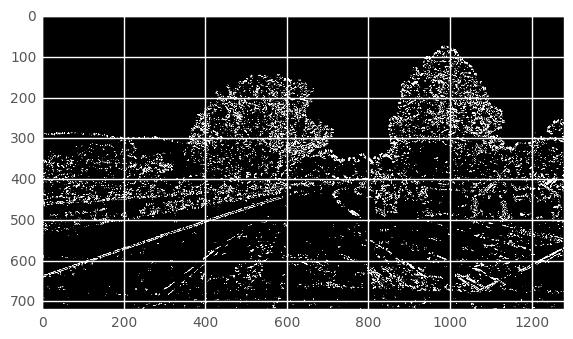

In [8]:
image = cv2.imread('test_images/test1.jpg')
a_image = abs_sobel_thresh(image, orient='x', ksize=3, thresh=(20,100))
b_image = abs_sobel_thresh(image, orient='y', ksize=3, thresh=(20,100))
m_image = mag_thresh(image, ksize=9, thresh=(20,100))
d_image = dir_thresh(image, ksize=9, thresh=(0.7, 1.3))

c = np.zeros_like(a_image)
c[((a_image == 1) & (b_image == 1)) | ((m_image == 1) & (d_image == 1))] = 1
plt.imshow(c, cmap='gray')
plt.show()

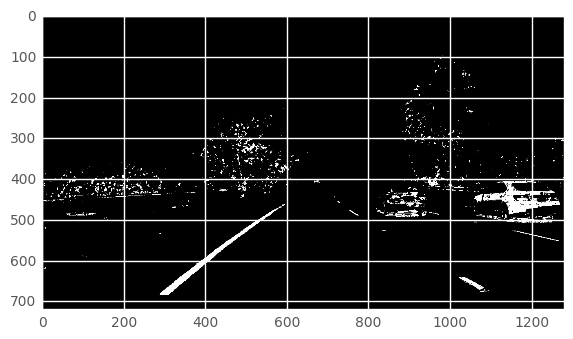

In [9]:
def hls_select(img, thresh=(0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    gray = hls[:,:,2]
    binary_output = np.zeros_like(gray)
    binary_output[(gray >= thresh[0]) & (gray <= thresh[1])] = 255
    return binary_output

image = cv2.imread('test_images/test1.jpg')
c = hls_select(image,thresh=(150,255))
plt.imshow(c, cmap='gray')
plt.show()

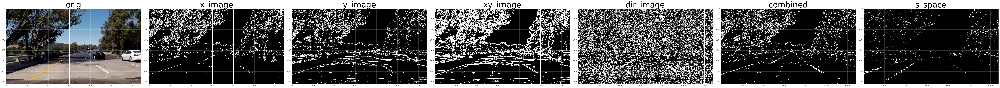

In [10]:
image = cv2.imread('test_images/test5.jpg')

x_image = abs_sobel_thresh(image, orient='x', ksize=3, thresh=(20,100))
y_image = abs_sobel_thresh(image, orient='y', ksize=3, thresh=(20,100))
xy_image = mag_thresh(image, ksize=9, thresh=(20,100))
dir_image = dir_thresh(image, ksize=9, thresh=(0.7, 1.3))

combined = np.zeros_like(a_image)
combined[((x_image == 1) & (y_image == 1)) | ((xy_image == 1) & (dir_image == 1))] = 1

s_space = hls_select(image,thresh=(150,200))
 
images_names = ["orig", "x_image", "y_image", "xy_image", "dir_image", "combined", "s_space"]
images = {"orig" : image,
          "x_image": x_image, 
          "y_image": y_image,
          "xy_image": xy_image, 
          "dir_image": dir_image, 
          "combined": combined, 
          "s_space" : s_space}



# Plot the result
n = len(images)
f, axes = plt.subplots( 1, n,figsize=(n*10,10))
f.tight_layout()

ix = 0
for k in images_names:
    v = images[k]
    if k=="orig":
        axes[ix].imshow(v[...,::-1])
    else:
        axes[ix].imshow(v,cmap='gray')
        
    axes[ix].set_title(k, fontsize=40)
    ix+=1


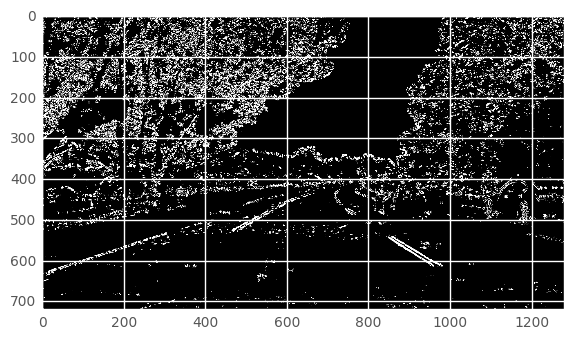

In [11]:
cimg = np.dstack( (np.zeros_like(s_space), combined, s_space))
cimg_bw = np.zeros_like(s_space)
cimg_bw[(combined == 1) | (s_space == 1)] = 255.0


csss = cv2.cvtColor(cimg_bw, cv2.COLOR_GRAY2RGB)

plt.imshow(csss)
plt.show()


In [ ]:
image_list = glob.glob('test_images/test*.jpg')

# Plot the result
n = len(image_list)

for ix, fname in enumerate(image_list):
    f, axes = plt.subplots( 1, 4,figsize=(50,50))
    f.tight_layout()
    
    image = cv2.imread(fname)

    x_image = abs_sobel_thresh(image, orient='x', ksize=3, thresh=(20,100))
    y_image = abs_sobel_thresh(image, orient='y', ksize=3, thresh=(20,100))
    xy_image = mag_thresh(image, ksize=9, thresh=(20,100))
    dir_image = dir_thresh(image, ksize=9, thresh=(0.7, 1.3))

    combined = np.zeros_like(a_image)
    combined[((x_image == 1) & (y_image == 1)) | ((xy_image == 1) & (dir_image == 1))] = 1

    s_space = hls_select(image,thresh=(150,200))
     
    cimg_bw = np.zeros_like(s_space)
    cimg_bw[(combined == 1) | (s_space == 1)] = 1

    images_names = ["orig", "xy_image", "dir_image", "final"]
    images = {"orig" : image,
          #"x_image": x_image, 
          #"y_image": y_image,
          "xy_image": xy_image, 
          "dir_image": dir_image, 
          #"combined": combined, 
          #"s_space" : s_space,
             "final": cimg_bw }
    
    iy = 0
    for k in images_names:
        v = images[k]
        if k=="orig":
            axes[iy].imshow(v[...,::-1])
        else:
            axes[iy].imshow(v,cmap='gray')
        
        axes[iy].set_title(k, fontsize=40)
        iy+=1
    plt.show()
    break
            



In [63]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(image, thresh=(90,200)):
    x_image = abs_sobel_thresh(image, orient='x', ksize=3, thresh=(20,100))
    y_image = abs_sobel_thresh(image, orient='y', ksize=3, thresh=(20,100))
    xy_image = mag_thresh(image, ksize=9, thresh=(20,100))
    dir_image = dir_thresh(image, ksize=9, thresh=(0.7, 1.3))

    combined = np.zeros_like(a_image)
    combined[((x_image == 1) & (y_image == 1)) | ((xy_image == 1) & (dir_image == 1))] = 1

    s_space = hls_select(image,thresh=(150,255))

    cimg_bw = np.zeros_like(s_space)
    cimg_bw[(combined == 1) | (s_space == 255)] = 255

    
    final = cimg_bw
    final = np.dstack((final, final, final))
    return final

#img = mpimg.imread('test_images/test5.jpg')
#out = process_image(img)
#plt.imshow(out)
#plt.show()

#inp = "project_video"
inp = "challenge_video"

white_output = inp + '_px.mp4'
clip1 = VideoFileClip(inp + ".mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video challenge_video_px.mp4
[MoviePy] Writing video challenge_video_px.mp4


100%|██████████| 485/485 [02:39<00:00,  3.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_px.mp4 

CPU times: user 1min 58s, sys: 30.7 s, total: 2min 29s
Wall time: 2min 41s


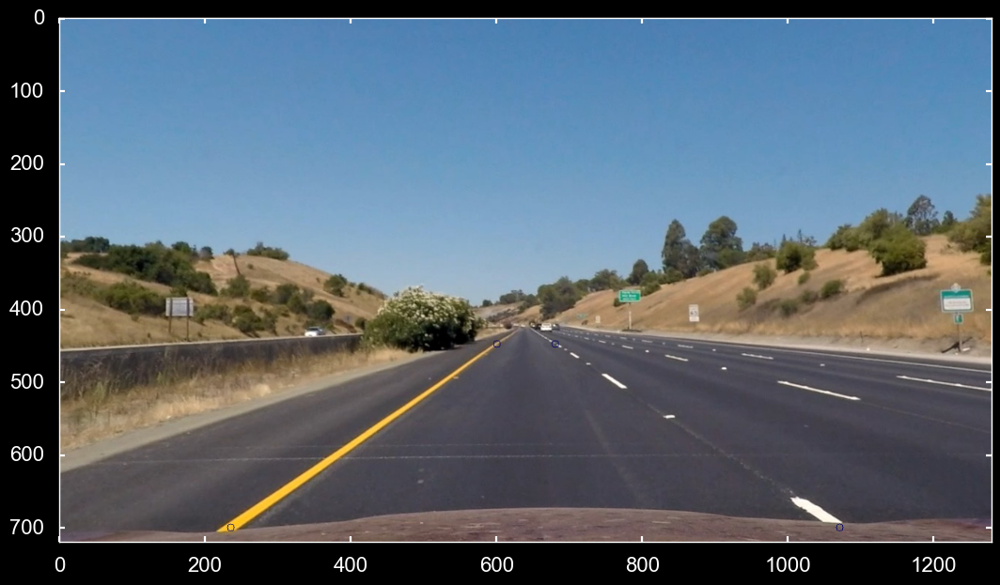

out shape: (720, 1280, 3)
img_size: (1280, 720)
[[  200.   200.]
 [ 1080.   200.]
 [ 1080.   520.]
 [  200.   520.]]
Warped SHape: (720, 1280, 3)


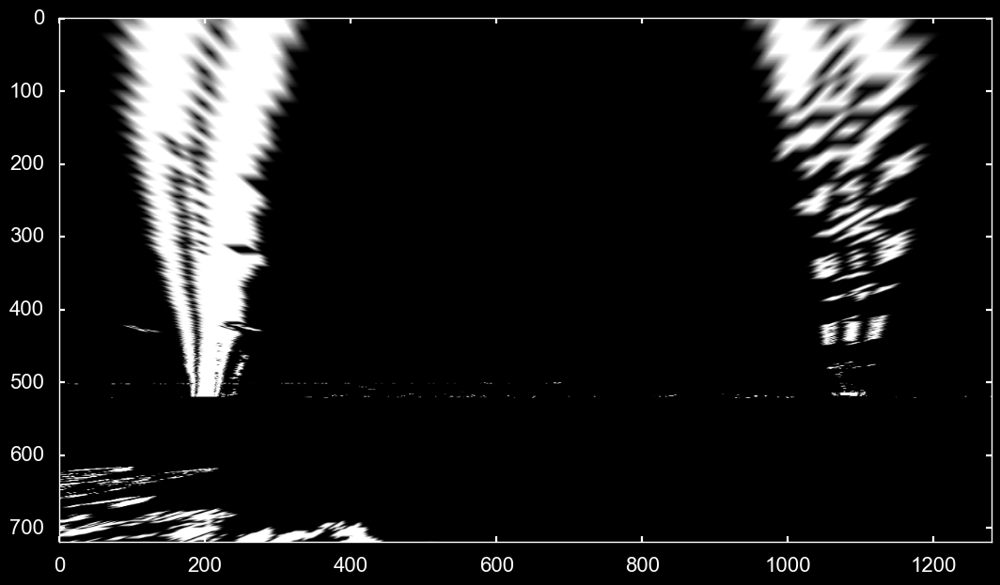

In [108]:
img = cv2.imread('test_images/straight_lines1.jpg')


undist = cal_undistort(img, objpoints, imgpoints)
out = process_image(undist)

#src = np.float32([[  600.0,  448.0],
#           [ 680.0,  448.0],
#           [ 1044.0,  676.0],
#           [ 250.0,  676.0]])

src = np.float32([[  600.0,  448.0],
           [ 680.0,  448.0],
           [ 1070.0,  700.0],
           [ 235.0,  700.0]])


ply = undist.copy()
for pt in src:
    ply = cv2.circle(ply, tuple(pt), radius=5, color=(100,1,1))

plt.imshow(ply[...,::-1])
plt.show()


offset = 200 # offset for dst points
print("out shape:" , out.shape)
img_size = (out.shape[1], out.shape[0])

print("img_size:",img_size)

dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                      [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
print(dst)
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(out, M, img_size, flags=cv2.INTER_LINEAR)

print("Warped SHape:", warped.shape)
plt.imshow(warped)
plt.show()
